In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm
import numpy as np
from netCDF4 import Dataset
from plot_picture_function import set_map_ticks,add_Chinese_provinces
from datetime import timedelta
import cartopy.crs as ccrs
from scipy import stats
from plot_bias_funtions import Plot_ComparedPic
import glob

c:\Users\YUJIE\.conda\envs\py3.8\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### 季节内月平均

### 针对两年来的每次时次计算LWP的结果

In [2]:
E5_hourbiasfiles = glob.glob(fr'F:\ZiYuanPingGu\GRL_data\ERA5\bias\stackERA5_*')
M2_hourbiasfiles = glob.glob(fr'F:\ZiYuanPingGu\GRL_data\MERRA2\bias\stackm2_*')
J5_hourbiasfiles = glob.glob(fr'F:\ZiYuanPingGu\GRL_data\JRA55\bias\stackj5_*')
J5_hourbiasfiles

['F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201901.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201902.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201903.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201904.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201905.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201906.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201907.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201908.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201909.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201910.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201911.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_201912.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_202001.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_202002.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_202003.nc',
 'F:\\ZiYuanPingGu\\GRL_data\\JRA55\\bias\\stackj5_2020

In [3]:
def season_seek(seas):
    if seas == 'spr':
        indexlist = ['03', '04', '05']
    elif seas == 'sum':
        indexlist = ['06', '07', '08']
    elif seas == 'aut':
        indexlist = ['09', '10', '11']
    elif seas == 'win':
        indexlist = ['12', '01', '02']

    return indexlist

def Compute_Season(seas, dataset, shortname):

    month_list = season_seek(seas)
    file_list = []
    for x in month_list:
        temp_list = glob.glob(fr'F:\ZiYuanPingGu\GRL_data\{dataset}\bias\stack{shortname}_*{x}.nc')
        file_list = file_list + temp_list
    for imonth in range(len(file_list)):
        if imonth == 0:
            ds = xr.open_dataset(file_list[imonth])
            H8hourlwparr = ds.H8_lwp_hour.data
            hourlwparr = ds[f'{dataset}_lwp_hour'].data
            ds.close()
        else:
            ds = xr.open_dataset(file_list[imonth])
            H8hourlwparr = np.concatenate([H8hourlwparr, ds.H8_lwp_hour.data], axis=2)
            hourlwparr = np.concatenate([hourlwparr, ds[f'{dataset}_lwp_hour'].data], axis=2)
            ds.close()
            print(hourlwparr.shape)

    Countvalid_stack = np.sum(H8hourlwparr != 0, axis=2)
    H8_sumstack = np.sum(H8hourlwparr, axis=2)
    sum_stack = np.sum(hourlwparr, axis=2)
    H8_stack = H8_sumstack / Countvalid_stack
    res_stack = sum_stack / Countvalid_stack
    H8_stack[H8_sumstack == 0] = np.nan
    H8_stack[Countvalid_stack < 10] = np.nan

    res_stack[sum_stack == 0] = np.nan
    res_stack[Countvalid_stack < 10] = np.nan
    print('-'*20)
    return res_stack, H8_stack

def Compute_Year(dataset, shortname):
    file_list = glob.glob(fr'F:\ZiYuanPingGu\GRL_data\{dataset}\bias\stack{shortname}_*.nc')
    for ifile in range(len(file_list)):
        if ifile == 0:
            ds = xr.open_dataset(file_list[ifile])
            H8hourlwparr = ds.H8_lwp_hour.data
            hourlwparr = ds[f'{dataset}_lwp_hour'].data
            ds.close()
        else:
            ds = xr.open_dataset(file_list[ifile])
            H8hourlwparr = np.concatenate([H8hourlwparr, ds.H8_lwp_hour.data], axis=2)
            hourlwparr = np.concatenate([hourlwparr, ds[f'{dataset}_lwp_hour'].data], axis=2)
            ds.close()
            print(hourlwparr.shape)

    Countvalid_stack = np.sum(H8hourlwparr != 0, axis=2)
    H8_sumstack = np.sum(H8hourlwparr, axis=2)
    sum_stack = np.sum(hourlwparr, axis=2)  #再分析资料
    H8_stack = H8_sumstack / Countvalid_stack
    res_stack = sum_stack / Countvalid_stack
    H8_stack[H8_sumstack == 0] = np.nan
    H8_stack[Countvalid_stack < 10] = np.nan

    res_stack[sum_stack == 0] = np.nan
    res_stack[Countvalid_stack < 10] = np.nan
    print("-"*20)
    return res_stack, H8_stack

In [8]:
ERA5_year_res, H8_year_res = Compute_Year('ERA5', 'ERA5')
MERRA2_year_res, _ = Compute_Year('MERRA2', 'm2')
JRA55_year_res, _ = Compute_Year('JRA55', 'j5')

(221, 241, 118)
(221, 241, 180)
(221, 241, 240)
(221, 241, 302)
(221, 241, 362)
(221, 241, 424)
(221, 241, 486)
(221, 241, 546)
(221, 241, 608)
(221, 241, 668)
(221, 241, 730)
(221, 241, 792)
(221, 241, 850)
(221, 241, 912)
(221, 241, 972)
(221, 241, 1034)
(221, 241, 1094)
(221, 241, 1156)
(221, 241, 1218)
(221, 241, 1278)
(221, 241, 1340)
(221, 241, 1400)
(221, 241, 1462)


C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:64: RuntimeWarning: invalid value encountered in divide
  H8_stack = H8_sumstack / Countvalid_stack
C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:65: RuntimeWarning: divide by zero encountered in divide
  res_stack = sum_stack / Countvalid_stack


--------------------
(221, 241, 118)
(221, 241, 180)
(221, 241, 240)
(221, 241, 302)
(221, 241, 362)
(221, 241, 424)
(221, 241, 486)
(221, 241, 546)
(221, 241, 608)
(221, 241, 668)
(221, 241, 730)
(221, 241, 792)
(221, 241, 850)
(221, 241, 912)
(221, 241, 972)
(221, 241, 1034)
(221, 241, 1094)
(221, 241, 1156)
(221, 241, 1218)
(221, 241, 1278)
(221, 241, 1340)
(221, 241, 1400)
(221, 241, 1462)
--------------------
(221, 241, 116)
(221, 241, 177)
(221, 241, 236)
(221, 241, 297)
(221, 241, 356)
(221, 241, 417)
(221, 241, 478)
(221, 241, 537)
(221, 241, 598)
(221, 241, 657)
(221, 241, 718)
(221, 241, 779)
(221, 241, 834)
(221, 241, 895)
(221, 241, 954)
(221, 241, 1015)
(221, 241, 1074)
(221, 241, 1135)
(221, 241, 1196)
(221, 241, 1255)
(221, 241, 1316)
(221, 241, 1375)
(221, 241, 1436)
--------------------


C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:65: RuntimeWarning: invalid value encountered in divide
  res_stack = sum_stack / Countvalid_stack


In [4]:
season_list = ['spr', 'sum', 'aut', 'win']
for seas in season_list:
    if seas == 'spr':
        ERA5_season_res, H8_season_res = Compute_Season(seas, 'ERA5', 'ERA5')  
        MERRA2_season_res, _ = Compute_Season(seas, 'MERRA2', 'm2')      
        JRA55_season_res, _ = Compute_Season(seas, 'JRA55', 'j5')

        H8_season_res = H8_season_res[np.newaxis,:,:]
        ERA5_season_res = ERA5_season_res[np.newaxis,:,:]
        MERRA2_season_res = MERRA2_season_res[np.newaxis,:,:]
        JRA55_season_res = JRA55_season_res[np.newaxis,:,:]
    else:
        ERA5_season_temp, H8_season_temp = Compute_Season(seas, 'ERA5', 'ERA5') 
        MERRA2_season_temp, _ = Compute_Season(seas, 'MERRA2', 'm2')    
        JRA55_season_temp, _ = Compute_Season(seas, 'JRA55', 'j5')
        H8_season_res = np.vstack([H8_season_res, H8_season_temp[np.newaxis,:,:]])
        ERA5_season_res = np.vstack([ERA5_season_res, ERA5_season_temp[np.newaxis,:,:]])
        MERRA2_season_res = np.vstack([MERRA2_season_res, MERRA2_season_temp[np.newaxis,:,:]])
        JRA55_season_res = np.vstack([JRA55_season_res, JRA55_season_temp[np.newaxis,:,:]])

c:\Users\YUJIE\.conda\envs\py3.8\lib\site-packages\gribapi\__init__.py:23: UserWarning: ecCodes 2.31.0 or higher is recommended. You are running version 2.27.0
  warnings.warn(


(221, 241, 124)
(221, 241, 184)
(221, 241, 244)
(221, 241, 306)
(221, 241, 368)
--------------------


C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:36: RuntimeWarning: invalid value encountered in divide
  H8_stack = H8_sumstack / Countvalid_stack
C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:37: RuntimeWarning: invalid value encountered in divide
  res_stack = sum_stack / Countvalid_stack


(221, 241, 124)
(221, 241, 184)
(221, 241, 244)
(221, 241, 306)
(221, 241, 368)
--------------------
(221, 241, 122)
(221, 241, 181)
(221, 241, 240)
(221, 241, 301)
(221, 241, 362)
--------------------
(221, 241, 120)
(221, 241, 182)
(221, 241, 244)
(221, 241, 306)
(221, 241, 368)
--------------------


C:\Users\YUJIE\AppData\Local\Temp\ipykernel_28532\121965945.py:37: RuntimeWarning: divide by zero encountered in divide
  res_stack = sum_stack / Countvalid_stack


(221, 241, 120)
(221, 241, 182)
(221, 241, 244)
(221, 241, 306)
(221, 241, 368)
--------------------
(221, 241, 118)
(221, 241, 179)
(221, 241, 240)
(221, 241, 301)
(221, 241, 362)
--------------------
(221, 241, 120)
(221, 241, 182)
(221, 241, 244)
(221, 241, 304)
(221, 241, 364)
--------------------
(221, 241, 120)
(221, 241, 182)
(221, 241, 244)
(221, 241, 304)
(221, 241, 364)
--------------------
(221, 241, 118)
(221, 241, 179)
(221, 241, 240)
(221, 241, 299)
(221, 241, 358)
--------------------
(221, 241, 124)
(221, 241, 186)
(221, 241, 248)
(221, 241, 304)
(221, 241, 362)
--------------------
(221, 241, 124)
(221, 241, 186)
(221, 241, 248)
(221, 241, 304)
(221, 241, 362)
--------------------
(221, 241, 122)
(221, 241, 183)
(221, 241, 244)
(221, 241, 299)
(221, 241, 354)
--------------------


In [5]:
lwpArr_list = [H8_season_res, ERA5_season_res, MERRA2_season_res, JRA55_season_res]
# iwpArr_list = [H8_iwpSeasRes, ERA5_iwpSeasRes, MERRA2_iwpSeasRes, JRA55_iwpSeasRes]
plot_data = []
for i in range(4): #spr sum aut win 
    for x in lwpArr_list: #dataarr loop
        plot_data.append(x[i,:,:])

In [6]:
x_e5 = np.linspace(80.0, 140.0, 241)
y_e5 = np.linspace(55.0, 0, 221)

x_m2 = np.linspace(80.0, 140.0, 121)
y_m2 = np.linspace(55.0, 0, 111)

x_j5 = np.linspace(80.0, 140.0, 49)
y_j5 = np.linspace(55.0, 0, 45)

In [9]:
E5_lwpBiasYm = ERA5_year_res - H8_year_res
M2_lwpBiasYm = MERRA2_year_res - H8_year_res
J5_lwpBiasYm = JRA55_year_res - H8_year_res

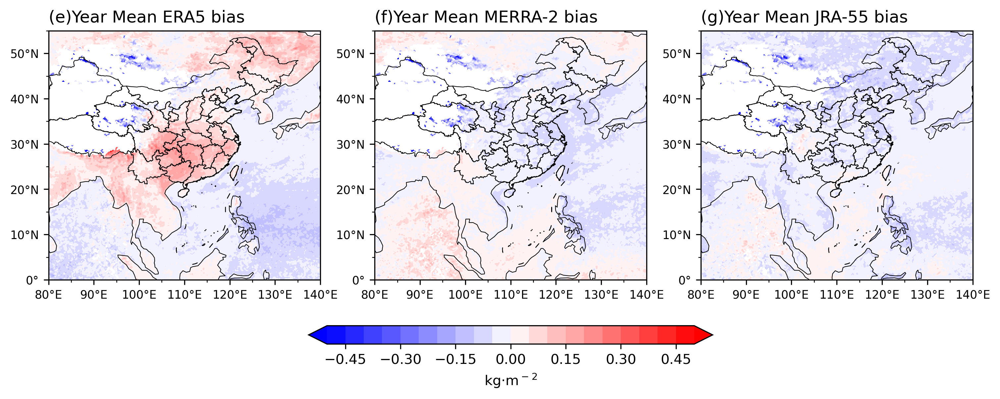

In [10]:
fig = plt.figure(figsize=(12,6), dpi=300)
axs = []
title_plot = 'Year Mean' 
proj = ccrs.PlateCarree()
extent = [80, 140, 0, 55]
ax1 = fig.add_subplot(131, projection=proj)
set_map_ticks(ax1, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax1.set_extent(extent, crs=proj)
# levels = np.linspace(-1.5, 1.5, 21)
levels = np.linspace(-0.5, 0.5, 21)
im1 = ax1.contourf(x_e5, y_e5, E5_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax1, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax1.coastlines(lw=0.5, color='k')
ax1.set_title(f'(e){title_plot} ERA5 bias', loc='left', fontsize=12)

ax2 = fig.add_subplot(132, projection=proj)
set_map_ticks(ax2, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax2.set_extent(extent, crs=proj)
im2 = ax2.contourf(x_e5, y_e5, M2_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax2, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax2.coastlines(lw=0.5, color='k')
ax2.set_title(f'(f){title_plot} MERRA-2 bias', loc='left', fontsize=12)

ax3 = fig.add_subplot(133, projection=proj)
set_map_ticks(ax3, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax3.set_extent(extent, crs=proj)
im3 = ax3.contourf(x_e5, y_e5, J5_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax3, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax3.coastlines(lw=0.5, color='k')
ax3.set_title(f'(g){title_plot} JRA-55 bias', loc='left', fontsize=12)
axs = [ax1, ax2, ax3]
cb = plt.colorbar(im1, ax=axs, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)


### 绘制全年的偏差图

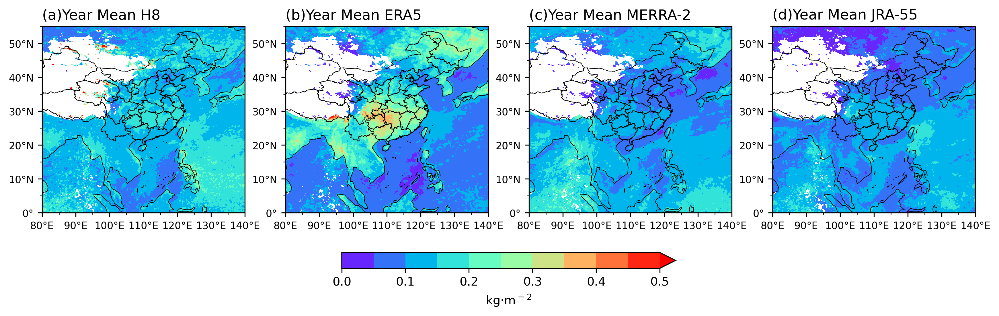

In [11]:
fig = plt.figure(figsize=(14,6), dpi=300)
axs = []
title_plot = 'Year Mean' 
proj = ccrs.PlateCarree()
extent = [80, 140, 0, 55]
ax1 = fig.add_subplot(141, projection=proj)
set_map_ticks(ax1, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax1.set_extent(extent, crs=proj)
levels = np.linspace(0, 0.5, 11)
# levels = np.linspace(0, 2, 11)
im1 = ax1.contourf(x_e5, y_e5, H8_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax1, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax1.coastlines(lw=0.5, color='k')
ax1.set_title(f'(a){title_plot} H8', loc='left', fontsize=12)
# plt.colorbar(im1, ax=ax1, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)

ax2 = fig.add_subplot(142, projection=proj)
set_map_ticks(ax2, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax1.set_extent(extent, crs=proj)
# levels = np.linspace(0, 0.2, 11)
im2 = ax2.contourf(x_e5, y_e5, ERA5_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax2, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax2.coastlines(lw=0.5, color='k')
ax2.set_title(f'(b){title_plot} ERA5', loc='left', fontsize=12)

ax3 = fig.add_subplot(143, projection=proj)
set_map_ticks(ax3, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax3.set_extent(extent, crs=proj)
im3 = ax3.contourf(x_e5, y_e5, MERRA2_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax3, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax3.coastlines(lw=0.5, color='k')
ax3.set_title(f'(c){title_plot} MERRA-2', loc='left', fontsize=12)

ax4 = fig.add_subplot(144, projection=proj)
set_map_ticks(ax4, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax4.set_extent(extent, crs=proj)
im4 = ax4.contourf(x_e5, y_e5, JRA55_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax4, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax4.coastlines(lw=0.5, color='k')
ax4.set_title(f'(d){title_plot} JRA-55', loc='left', fontsize=12)
axs = [ax1, ax2, ax3, ax4]
cb = plt.colorbar(im2, ax=axs, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)

In [26]:
def Plots_sc1(solution, data, picname):#自定义绘图
    fig = plt.figure(figsize=(13,11), dpi=300)
    month = ['MAM','JJA','SON','DJF']
    dataname = ["H8", "ERA5", "MERRA-2", "JRA-55"]
    axs = []
    
    for j in range(4):
        for i in range(len(picname)):
            # print(j, i)
            ynum = (60/solution[i])+1
            xnum = (55/solution[i])+1
            y = np.linspace(80, 140, int(ynum))
            x = np.linspace(55, 0, int(xnum))

            X_array, Y_array = np.meshgrid(y, x)
            extent = [80, 140, 0, 55]
            proj = ccrs.PlateCarree()#选择投影方式，平面投影
            ax1 = fig.add_subplot(4,len(picname),j*4+i+1, projection = proj)#创建一个轴，或者是说主体
            # 设置经纬度刻度.
            set_map_ticks(ax1, dx=20, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
            ax1.set_extent(extent, crs=proj)
            levels = np.linspace(0, 0.5, 11)
            ### iwp
            # if i == 0:
            #     levels = np.linspace(0, 2, 11)
            # else:
            #     levels = np.linspace(0, 0.2, 11)
            im1 = ax1.contourf(X_array, Y_array, data[4*j+i], levels=levels, cmap='rainbow', extend='max')#ERA5_clc_CHN[6,:,:]
            add_Chinese_provinces(ax1, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
            ax1.coastlines(lw=0.5, color='k')
            #设置图标
            # if j == 0:
            #     ax1.set_title(picname[i], fontsize=15)
            # if i == 0:
            #     ax1.set_ylabel(month[j], fontsize=15)
            # #到了最后一行，绘制colorbar。
            ### lwp
            ### iwp
            # if j == 3 and i == 0:
            #     cax1 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0-0.04, 
            #                          ax1.get_position().x1-ax1.get_position().x0, 0.01])#预留colorbar的空间
            #     cb = plt.colorbar(im1, cax=cax1,label='kg·m$^-$$^2$', orientation='horizontal')#水平放置
            # if j == 3 and i > 0:
            #     cax1 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0-0.04, 
            #                          ax1.get_position().x1-ax1.get_position().x0, 0.01])#预留colorbar的空间
            #     cb = plt.colorbar(im1, cax=cax1,label='kg·m$^-$$^2$', orientation='horizontal')#水平放置
            axs.append(ax1)
            xlabel = '('+chr(ord('a')+i+j*4)+')'+' '+month[j]+'_'+dataname[i]
            ax1.set_title(xlabel, fontsize=12, loc='left')
    plt.subplots_adjust(wspace=0.05, hspace=0.35)
    cb = plt.colorbar(im1, ax=axs, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.03, pad=0.05)
    plt.savefig(r"C:\Users\YUJIE\Desktop\GRL图片\subplots_lwp.jpg", bbox_inches='tight', pad_inches=0.1, dpi=300)

In [24]:
# H8_lwpSeasRes = Compute_Season(H8_lwpOriArr)
# ERA5_lwpSeasRes = Compute_Season(ERA5_lwpOriArr)
# MERRA2_lwpSeasRes = Compute_Season(MERRA2_lwpOriArr)
# JRA55_lwpSeasRes = Compute_Season(JRA55_lwpOriArr)
lwpArr_list = [H8_lwpSeasRes, ERA5_lwpSeasRes, MERRA2_lwpSeasRes, JRA55_lwpSeasRes]
iwpArr_list = [H8_iwpSeasRes, ERA5_iwpSeasRes, MERRA2_iwpSeasRes, JRA55_iwpSeasRes]
plot_data = []
for i in range(4): #spr sum aut win 
    for x in lwpArr_list: #dataarr loop
        plot_data.append(x[i,:,:])


NameError: name 'H8_lwpSeasRes' is not defined

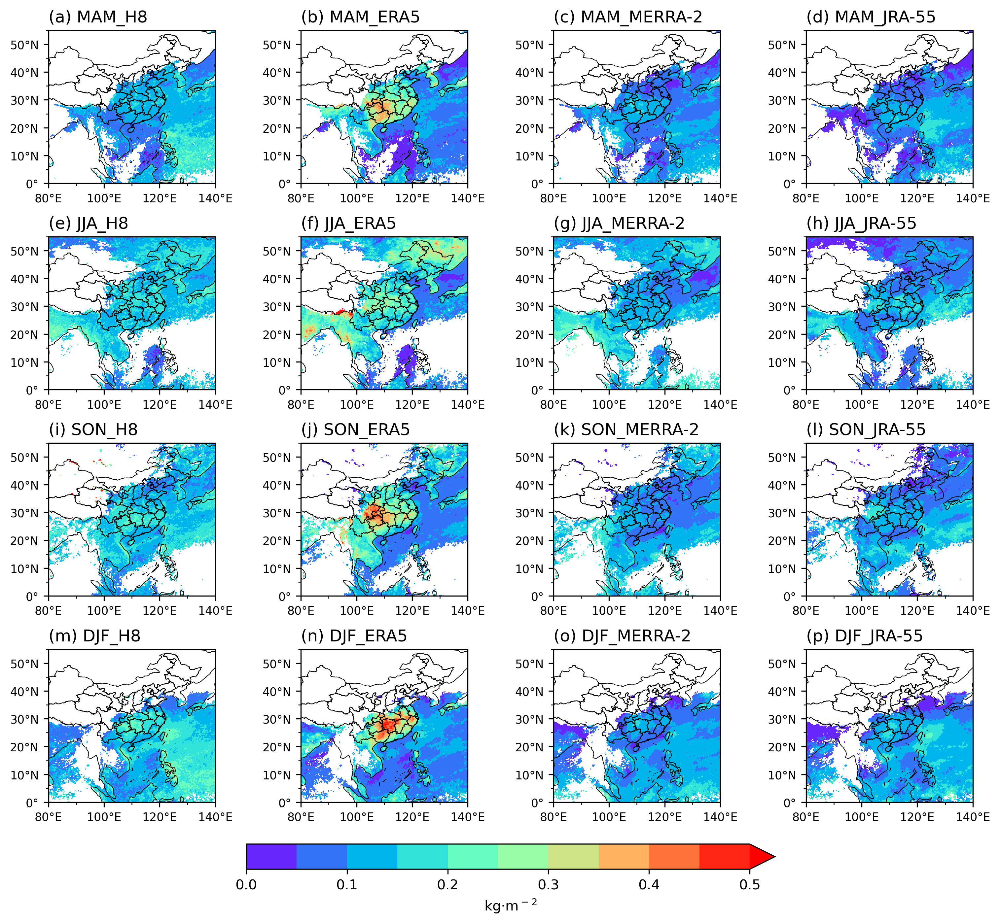

In [27]:
Plots_sc1([0.25, 0.25, 0.25, 0.25], plot_data, ['H8', 'ERA5', 'MERRA-2', 'JRA-55'])

In [28]:
def Plots_sc2(solution, data, picname):#自定义绘图
    fig = plt.figure(figsize=(9,11), dpi=300)
    month = ['MAM','JJA','SON','DJF']
    dataname = ["ERA5", "MERRA-2", "JRA-55"]
    axs = []
    
    for j in range(4):
        for i in range(len(picname)):
            # print(j, i)
            ynum = (60/solution[i])+1
            xnum = (55/solution[i])+1
            y = np.linspace(80, 140, int(ynum))
            x = np.linspace(55, 0, int(xnum))

            X_array, Y_array = np.meshgrid(y, x)
            extent = [80, 140, 0, 55]
            proj = ccrs.PlateCarree()#选择投影方式，平面投影
            ax1 = fig.add_subplot(4,len(picname),j*3+i+1, projection = proj)#创建一个轴，或者是说主体
            # 设置经纬度刻度.
            set_map_ticks(ax1, dx=20, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
            ax1.set_extent(extent, crs=proj)
            levels = np.linspace(-0.3, 0.3, 11)
            ### iwp
            # if i == 0:
            #     levels = np.linspace(0, 2, 11)
            # else:
            #     levels = np.linspace(0, 0.2, 11)
            im1 = ax1.contourf(X_array, Y_array, data[3*j+i], levels=levels, cmap='bwr', extend='both')#ERA5_clc_CHN[6,:,:]
            add_Chinese_provinces(ax1, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
            ax1.coastlines(lw=0.5, color='k')
            #设置图标
            # if j == 0:
            #     ax1.set_title(picname[i], fontsize=15)
            # if i == 0:
            #     ax1.set_ylabel(month[j], fontsize=15)
            # #到了最后一行，绘制colorbar。
            ### lwp
            ### iwp
            # if j == 3 and i == 0:
            #     cax1 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0-0.04, 
            #                          ax1.get_position().x1-ax1.get_position().x0, 0.01])#预留colorbar的空间
            #     cb = plt.colorbar(im1, cax=cax1,label='kg·m$^-$$^2$', orientation='horizontal')#水平放置
            # if j == 3 and i > 0:
            #     cax1 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0-0.04, 
            #                          ax1.get_position().x1-ax1.get_position().x0, 0.01])#预留colorbar的空间
            #     cb = plt.colorbar(im1, cax=cax1,label='kg·m$^-$$^2$', orientation='horizontal')#水平放置
            axs.append(ax1)
            xlabel = '('+chr(ord('a')+i+j*3)+')'+' '+month[j]+'_'+dataname[i]
            ax1.set_title(xlabel, fontsize=12, loc='left')
    plt.subplots_adjust(wspace=0.05, hspace=0.35)
    cb = plt.colorbar(im1, ax=axs, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.03, pad=0.05)
    plt.savefig(r"C:\Users\YUJIE\Desktop\GRL图片\subplots_biaslwp.jpg", bbox_inches='tight', pad_inches=0.1, dpi=300)

In [29]:
lwpArr_list = [H8_season_res, ERA5_season_res, MERRA2_season_res, JRA55_season_res]
ERA5_lwpBiasSeasRes = np.zeros_like(H8_season_res)
MERRA2_lwpBiasSeasRes = np.zeros_like(H8_season_res)
JRA55_lwpBiasSeasRes = np.zeros_like(H8_season_res)
for i in range(4):
    ERA5_lwpBiasSeasRes[i,:,:] = ERA5_season_res[i,:,:] - H8_season_res[i,:,:]
    MERRA2_lwpBiasSeasRes[i,:,:] = MERRA2_season_res[i,:,:] - H8_season_res[i,:,:]
    JRA55_lwpBiasSeasRes[i,:,:] = JRA55_season_res[i,:,:] - H8_season_res[i,:,:]

In [30]:
lwpArr_list = [ERA5_lwpBiasSeasRes, MERRA2_lwpBiasSeasRes, JRA55_lwpBiasSeasRes]
# iwpArr_list = [ERA5_iwpBiasSeasRes, MERRA2_iwpBiasSeasRes, JRA55_iwpBiasSeasRes]
plot_biasdata = []
for i in range(4): #spr sum aut win 
    for x in lwpArr_list: #dataarr loop
        plot_biasdata.append(x[i,:,:])

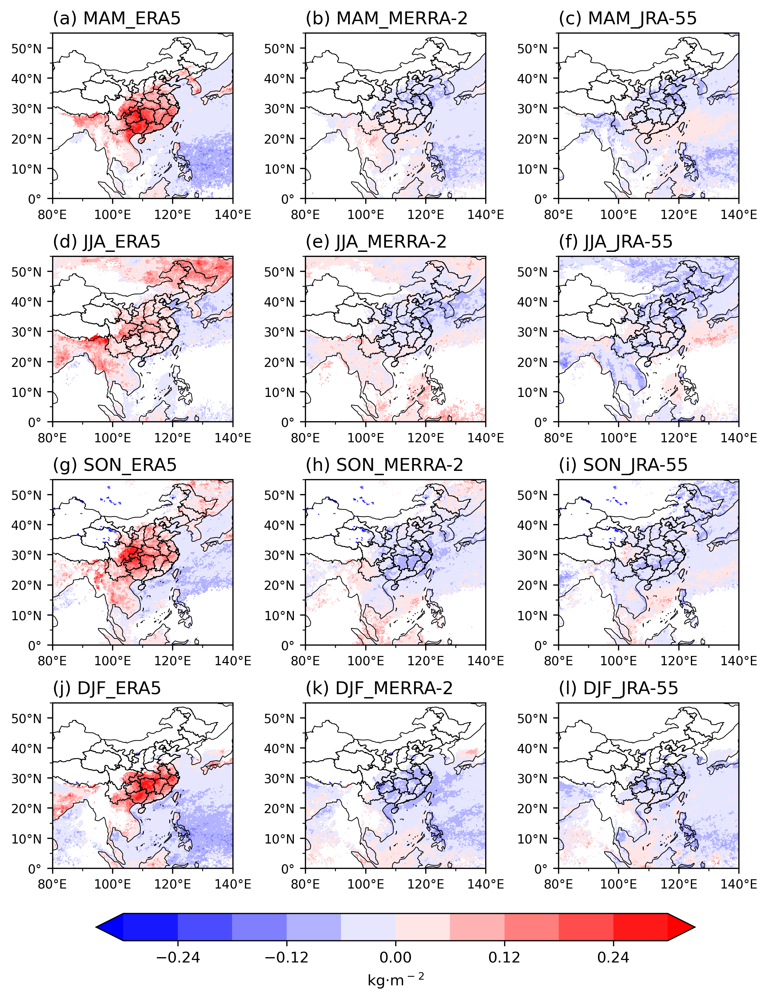

In [31]:
Plots_sc2([0.25, 0.25, 0.25], plot_biasdata, ['ERA5', 'MERRA-2', 'JRA-55'])

### 绘制2019至2020年的lwp的PDF图

In [12]:
H8_lwpvector = H8_year_res[~np.isnan(H8_year_res)].flatten()
E5_lwpvector = ERA5_year_res[~np.isnan(ERA5_year_res)].flatten()
M2_lwpvector = MERRA2_year_res[~np.isnan(MERRA2_year_res)].flatten()
J5_lwpvector = JRA55_year_res[~np.isnan(JRA55_year_res)].flatten()

E5_lwpBiasvector = E5_lwpBiasYm[~np.isnan(E5_lwpBiasYm)].flatten()
M2_lwpBiasvector = M2_lwpBiasYm[~np.isnan(M2_lwpBiasYm)].flatten()
J5_lwpBiasvector = J5_lwpBiasYm[~np.isnan(J5_lwpBiasYm)].flatten()

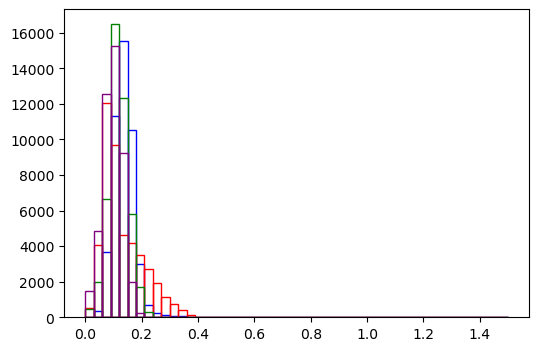

In [13]:
plt.figure(figsize=(6,4))
ydata1, xdata1, cm = plt.hist(H8_lwpvector, bins=50, range=(0, 1.5), facecolor='None', edgecolor='blue')
ydata2, xdata2, cm = plt.hist(E5_lwpvector, bins=50, range=(0, 1.5), facecolor='None', edgecolor='Red')
ydata3, xdata3, cm = plt.hist(M2_lwpvector, bins=50, range=(0, 1.5), facecolor='None', edgecolor='Green')
ydata4, xdata4, cm = plt.hist(J5_lwpvector, bins=50, range=(0, 1.5), facecolor='None', edgecolor='purple')

In [14]:
y1cumsum = np.cumsum(ydata1/ydata1.sum())
y1sum = ydata1/ydata1.sum()
x1mid = (xdata1[:-1]+xdata1[1:])*0.5

y2cumsum = np.cumsum(ydata2/ydata2.sum())
y2sum = ydata2/ydata2.sum()
x2mid = (xdata2[:-1]+xdata2[1:])*0.5

y3cumsum = np.cumsum(ydata3/ydata3.sum())
y3sum = ydata3/ydata3.sum()
x3mid = (xdata3[:-1]+xdata3[1:])*0.5

y4cumsum = np.cumsum(ydata4/ydata4.sum())
y4sum = ydata4/ydata4.sum()
x4mid = (xdata4[:-1]+xdata4[1:])*0.5


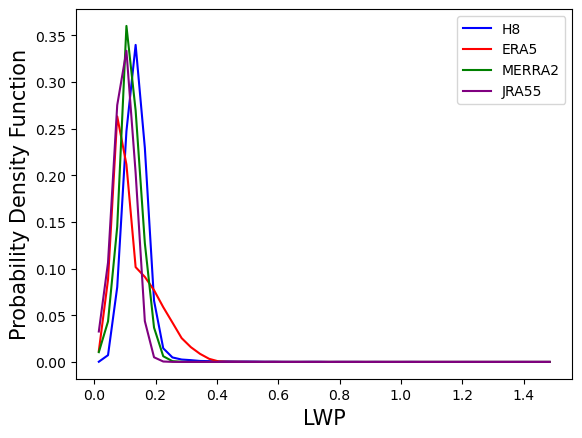

In [15]:
plt.plot(x1mid, y1sum, color='blue', label='H8')
plt.plot(x2mid, y2sum, color='red', label='ERA5')
plt.plot(x3mid, y3sum, color='green', label='MERRA2')
plt.plot(x4mid, y4sum, color='purple', label='JRA55')
plt.xlabel("LWP", fontsize=15)
plt.ylabel("Probability Density Function", fontsize=15)
plt.legend()

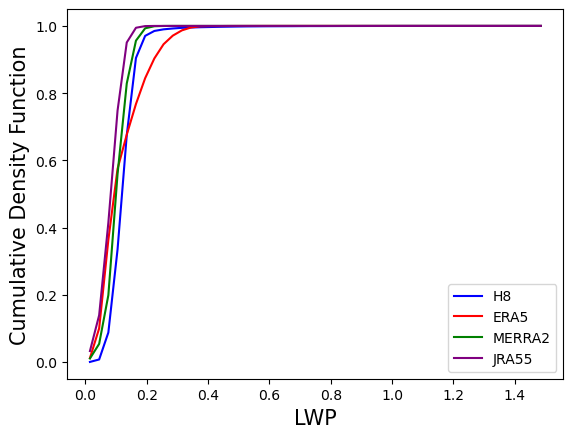

In [16]:
plt.plot(x1mid, y1cumsum, color='blue', label='H8')
plt.plot(x2mid, y2cumsum, color='red', label='ERA5')
plt.plot(x3mid, y3cumsum, color='green', label='MERRA2')
plt.plot(x4mid, y4cumsum, color='purple', label='JRA55')
plt.xlabel("LWP", fontsize=15)
plt.ylabel("Cumulative Density Function", fontsize=15)
plt.legend()

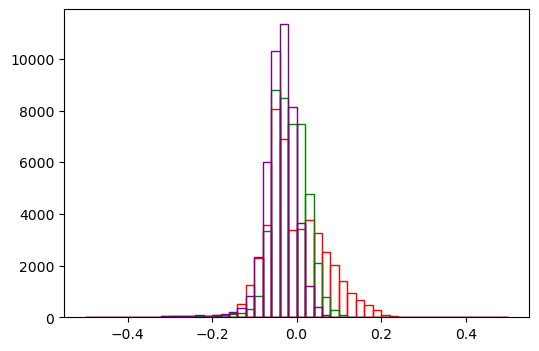

In [17]:
plt.figure(figsize=(6,4))
# ydata1, xdata1, cm = plt.hist(H8_lwpvector, bins=50, range=(0, 1.5), facecolor='None', edgecolor='blue')
ydata2, xdata2, cm = plt.hist(E5_lwpBiasvector, bins=50, range=(-0.5, 0.5), facecolor='None', edgecolor='Red')
ydata3, xdata3, cm = plt.hist(M2_lwpBiasvector, bins=50, range=(-0.5, 0.5), facecolor='None', edgecolor='Green')
ydata4, xdata4, cm = plt.hist(J5_lwpBiasvector, bins=50, range=(-0.5, 0.5), facecolor='None', edgecolor='purple')

In [18]:
# y1cumsum = np.cumsum(ydata1/ydata1.sum())
# y1sum = ydata1/ydata1.sum()
# x1mid = (xdata1[:-1]+xdata1[1:])*0.5

y2cumsum = np.cumsum(ydata2/ydata2.sum())
y2sum = ydata2/ydata2.sum() * 100
x2mid = (xdata2[:-1]+xdata2[1:])*0.5

y3cumsum = np.cumsum(ydata3/ydata3.sum())
y3sum = ydata3/ydata3.sum() * 100
x3mid = (xdata3[:-1]+xdata3[1:])*0.5

y4cumsum = np.cumsum(ydata4/ydata4.sum())
y4sum = ydata4/ydata4.sum() * 100
x4mid = (xdata4[:-1]+xdata4[1:])*0.5

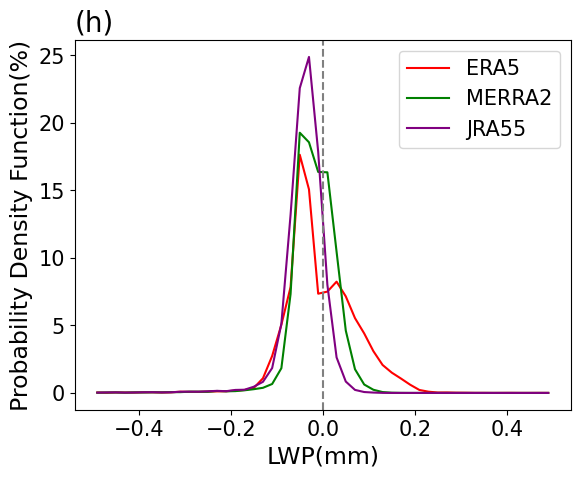

In [19]:
# plt.plot(x1mid, y1sum, color='blue', label='H8')
plt.plot(x2mid, y2sum, color='red', label='ERA5')
plt.plot(x3mid, y3sum, color='green', label='MERRA2')
plt.plot(x4mid, y4sum, color='purple', label='JRA55')
plt.xlabel("LWP(mm)", fontsize=17)
plt.axvline(x=0, color='grey', linestyle='--')
plt.ylabel("Probability Density Function(%)", fontsize=17)
plt.tick_params('both', labelsize=15)
plt.title('(h)', loc='left', fontsize=20)
plt.legend(fontsize=15)

In [ ]:
# plt.plot(x1mid, y1cumsum, color='blue', label='H8')
plt.plot(x2mid, y2cumsum, color='red', label='ERA5')
plt.plot(x3mid, y3cumsum, color='green', label='MERRA2')
plt.plot(x4mid, y4cumsum, color='purple', label='JRA55')
plt.xlabel("LWP", fontsize=15)
plt.ylabel("Cumulative Density Function", fontsize=15)
plt.legend()

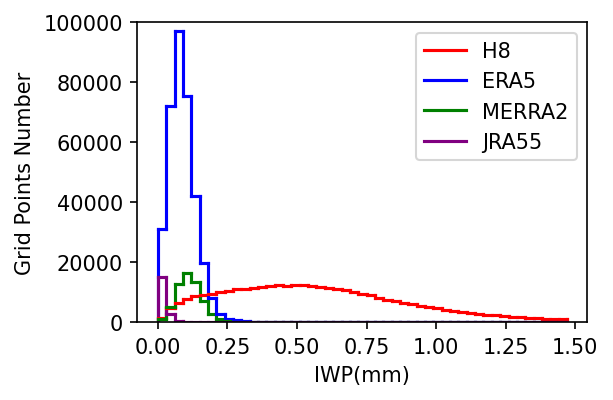

In [18]:
fig = plt.figure(figsize=(6,4), dpi=150)
ax = fig.add_axes([0, 0, 0.5, 0.5])
#最开始的竖线
ax.plot([xdata1[0], xdata1[0]], [0, ydata1[0]], color='red', label='H8')
ax.plot([xdata2[0], xdata2[0]], [0, ydata2[0]], color='blue', label='ERA5')
ax.plot([xdata3[0], xdata3[0]], [0, ydata3[0]], color='green', label='MERRA2')
ax.plot([xdata4[0], xdata4[0]], [0, ydata4[0]], color='purple', label='JRA55')
for i in range(len(xdata1)-2):
    ax.plot([xdata1[i], xdata1[i+1]], [ydata1[i], ydata1[i]], color='red')
    ax.plot([xdata1[i+1], xdata1[i+1]], [ydata1[i], ydata1[i+1]], color='red')

    ax.plot([xdata2[i], xdata2[i+1]], [ydata2[i], ydata2[i]], color='blue')
    ax.plot([xdata2[i+1], xdata2[i+1]], [ydata2[i], ydata2[i+1]], color='blue')

    ax.plot([xdata3[i], xdata3[i+1]], [ydata3[i], ydata3[i]], color='green')
    ax.plot([xdata3[i+1], xdata3[i+1]], [ydata3[i], ydata3[i+1]], color='green')

    ax.plot([xdata4[i], xdata2[i+1]], [ydata4[i], ydata4[i]], color='purple')
    ax.plot([xdata4[i+1], xdata2[i+1]], [ydata4[i], ydata4[i+1]], color='purple')

ax.set_ylim([0, 100000])
# ax.set_xlim([0, 1.5])
# ax.set_yscale('log')
ax.set_ylabel("Grid Points Number")
ax.set_xlabel("IWP(mm)")
ax.legend()

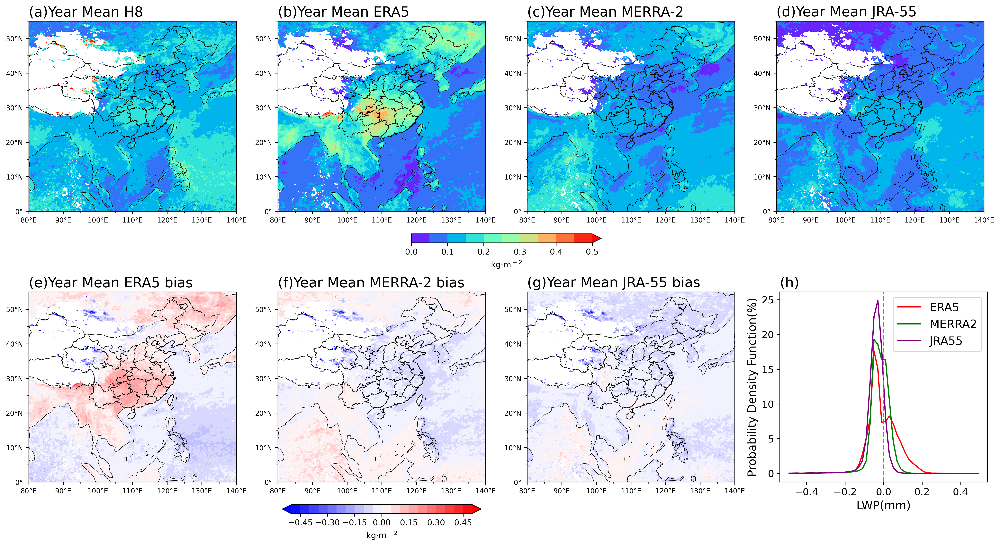

In [32]:
fig = plt.figure(figsize=(21,11), dpi=300)
axs = []
title_plot = 'Year Mean' 
proj = ccrs.PlateCarree()
extent = [80, 140, 0, 55]
ax1 = fig.add_subplot(241, projection=proj)
set_map_ticks(ax1, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax1.set_extent(extent, crs=proj)
levels = np.linspace(0, 0.5, 11)
# levels = np.linspace(0, 2, 11)
im1 = ax1.contourf(x_e5, y_e5, H8_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax1, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax1.coastlines(lw=0.5, color='k')
ax1.set_title(f'(a)Year Mean H8', loc='left', fontsize=17)
# plt.colorbar(im1, ax=ax1, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)

ax2 = fig.add_subplot(242, projection=proj)
set_map_ticks(ax2, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax1.set_extent(extent, crs=proj)
# levels = np.linspace(0, 0.2, 11)
im2 = ax2.contourf(x_e5, y_e5, ERA5_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax2, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax2.coastlines(lw=0.5, color='k')
ax2.set_title(f'(b)Year Mean ERA5', loc='left', fontsize=17)

ax3 = fig.add_subplot(243, projection=proj)
set_map_ticks(ax3, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax3.set_extent(extent, crs=proj)
im3 = ax3.contourf(x_e5, y_e5, MERRA2_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax3, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax3.coastlines(lw=0.5, color='k')
ax3.set_title(f'(c)Year Mean MERRA-2', loc='left', fontsize=17)

ax4 = fig.add_subplot(244, projection=proj)
set_map_ticks(ax4, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax4.set_extent(extent, crs=proj)
im4 = ax4.contourf(x_e5, y_e5, JRA55_year_res, levels=levels, cmap='rainbow', extend='max')
add_Chinese_provinces(ax4, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax4.coastlines(lw=0.5, color='k')
ax4.set_title(f'(d)Year Mean JRA-55', loc='left', fontsize=17)
axs = [ax1, ax2, ax3, ax4]
cb = plt.colorbar(im2, ax=axs, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)
#---------------------------------------------------
title_plot = 'Year Mean' 
proj = ccrs.PlateCarree()
extent = [80, 140, 0, 55]
ax5 = fig.add_subplot(245, projection=proj)
set_map_ticks(ax5, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax5.set_extent(extent, crs=proj)
# levels = np.linspace(-1.5, 1.5, 21)
levels = np.linspace(-0.5, 0.5, 21)
im3 = ax5.contourf(x_e5, y_e5, E5_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax5, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax5.coastlines(lw=0.5, color='k')
ax5.set_title(f'(e)Year Mean ERA5 bias', loc='left', fontsize=17)

ax6 = fig.add_subplot(246, projection=proj)
set_map_ticks(ax6, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax6.set_extent(extent, crs=proj)
im4 = ax6.contourf(x_e5, y_e5, M2_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax6, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax6.coastlines(lw=0.5, color='k')
ax6.set_title(f'(f)Year Mean MERRA-2 bias', loc='left', fontsize=17)

ax7 = fig.add_subplot(247, projection=proj)
set_map_ticks(ax7, dx=10, dy=10, nx=1, ny=1, labelsize='small')#自定义函数set_map_tick
ax7.set_extent(extent, crs=proj)
im5 = ax7.contourf(x_e5, y_e5, J5_lwpBiasYm, levels=levels, cmap='bwr', extend='both')
add_Chinese_provinces(ax7, lw=0.5, ec='k', fc='none')#后两个参数是设置eagecolor,facecolor,linewigth线宽
ax7.coastlines(lw=0.5, color='k')
ax7.set_title(f'(g)Year Mean JRA-55 bias', loc='left', fontsize=17)
axs2 = [ax5, ax6, ax7]
cb2 = plt.colorbar(im3, ax=axs2, label='kg·m$^-$$^2$', orientation='horizontal', fraction=0.04, pad=0.1)
#-----------------------------------------
bbox = ax7.get_position() 
ax8 = fig.add_subplot(248)
ax8.plot(x2mid, y2sum, color='red', label='ERA5')
ax8.plot(x3mid, y3sum, color='green', label='MERRA2')
ax8.plot(x4mid, y4sum, color='purple', label='JRA55')
ax8.set_xlabel("LWP(mm)", fontsize=14)
ax8.axvline(x=0, color='grey', linestyle='--')
ax8.set_ylabel("Probability Density Function(%)", fontsize=14)
ax8.tick_params('both', labelsize=12)
ax8.set_title('(h)', loc='left', fontsize=17)
ax8.legend(fontsize=14)
plt.gca().set_position([bbox.x0 + 0.205, bbox.y0, bbox.width, bbox.height])
plt.savefig(r"C:\Users\YUJIE\Desktop\GRL图片\subplots8.jpg", bbox_inches='tight', pad_inches=0.1, dpi=300)